In [53]:
'''
The Leung-Malik (LM) Filter Bank, implementation in python

T. Leung and J. Malik. Representing and recognizing the visual appearance of
materials using three-dimensional textons. International Journal of Computer
Vision, 43(1):29-44, June 2001.

Reference: http://www.robots.ox.ac.uk/~vgg/research/texclass/filters.html
'''

import numpy as np
import cv2
import matplotlib.pyplot as plt

In [54]:
def gaussian1d(sigma, mean, x, ord):
    x = np.array(x)
    x_ = x - mean
    var = sigma**2

    # Gaussian Function
    g1 = (1/np.sqrt(2*np.pi*var))*(np.exp((-1*x_*x_)/(2*var)))
    
    if ord == 0:
        g = g1
        return g
    elif ord == 1:
        g = -g1*((x_)/(var))
        return g
    else:
        g = g1*(((x_*x_) - var)/(var**2))
        return g


In [55]:
def gaussian2d(sup, scales):
    var = scales * scales
    shape = (sup,sup)
    n,m = [(i - 1)/2 for i in shape]
    x,y = np.ogrid[-m:m+1,-n:n+1]
    g = (1/np.sqrt(2*np.pi*var))*np.exp( -(x*x + y*y) / (2*var) )
    return g

In [56]:
def log2d(sup, scales):
    var = scales * scales
    shape = (sup,sup)
    n,m = [(i - 1)/2 for i in shape]
    x,y = np.ogrid[-m:m+1,-n:n+1]
    g = (1/np.sqrt(2*np.pi*var))*np.exp( -(x*x + y*y) / (2*var) )
    h = g*((x*x + y*y) - var)/(var**2)
    return h

In [57]:
def makefilter(scale, phasex, phasey, pts, sup):

    gx = gaussian1d(3*scale, 0, pts[0,...], phasex)
    gy = gaussian1d(scale,   0, pts[1,...], phasey)

    image = gx*gy

    image = np.reshape(image,(sup,sup))
    return image

In [58]:
def makeLMfilters():
    sup     = 49
    scalex  = np.sqrt(2) * np.array([1,2,3])
    norient = 6
    nrotinv = 12

    nbar  = len(scalex)*norient
    nedge = len(scalex)*norient
    nf    = nbar+nedge+nrotinv
    F     = np.zeros([sup,sup,nf])
    hsup  = (sup - 1)/2

    x = [np.arange(-hsup,hsup+1)]
    y = [np.arange(-hsup,hsup+1)]

    [x,y] = np.meshgrid(x,y)

    orgpts = [x.flatten(), y.flatten()]
    orgpts = np.array(orgpts)
    
    count = 0
    for scale in range(len(scalex)):
        for orient in range(norient):
            angle = (np.pi * orient)/norient
            c = np.cos(angle)
            s = np.sin(angle)
            rotpts = [[c+0,-s+0],[s+0,c+0]]
            rotpts = np.array(rotpts)
            rotpts = np.dot(rotpts,orgpts)
            F[:,:,count] = makefilter(scalex[scale], 0, 1, rotpts, sup)
            F[:,:,count+nedge] = makefilter(scalex[scale], 0, 2, rotpts, sup)
            count = count + 1
            
    count = nbar+nedge
    scales = np.sqrt(2) * np.array([1,2,3,4])
    
    for i in range(len(scales)):
        F[:,:,count]   = gaussian2d(sup, scales[i])
        count = count + 1
        
    for i in range(len(scales)):
        F[:,:,count] = log2d(sup, scales[i])
        count = count + 1
        
    for i in range(len(scales)):
        F[:,:,count] = log2d(sup, 3*scales[i])
        count = count + 1
        
    return F

In [59]:
F = makeLMfilters()
print(F.shape) #same as print(np.shape(F))

(49, 49, 48)


## Examining Separable Filters 

0-17 - First order Gaussian
18-35 - Second order Gaussian
36-39 - Gaussian
40-47 - Laplacian of Gaussian

In [60]:
# Show singular value matrix 

for i in range(0,48):
    np.set_printoptions(precision=4)
    U, E, V = np.linalg.svd(F[:,:,i])

    # If rank is 1, filter is separable.
    if(np.linalg.matrix_rank(F[:,:,i]) == 1):
        printout = "filter %d is separable, with a rank of %s" % (i, np.linalg.matrix_rank(F[:,:,i]))
        print(printout)

filter 0 is separable, with a rank of 1
filter 3 is separable, with a rank of 1
filter 6 is separable, with a rank of 1
filter 9 is separable, with a rank of 1
filter 12 is separable, with a rank of 1
filter 15 is separable, with a rank of 1
filter 18 is separable, with a rank of 1
filter 21 is separable, with a rank of 1
filter 24 is separable, with a rank of 1
filter 27 is separable, with a rank of 1
filter 30 is separable, with a rank of 1
filter 33 is separable, with a rank of 1
filter 36 is separable, with a rank of 1
filter 37 is separable, with a rank of 1
filter 38 is separable, with a rank of 1
filter 39 is separable, with a rank of 1


## First order derivative Gaussian Filter

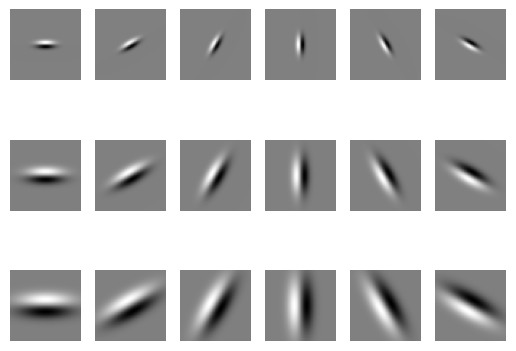

In [61]:
for i in range(0,18):
    plt.subplot(3,6,i+1)
    plt.axis('off')
    plt.imshow(F[:,:,i], cmap = 'gray')

## Second order derivative Gaussian Filter

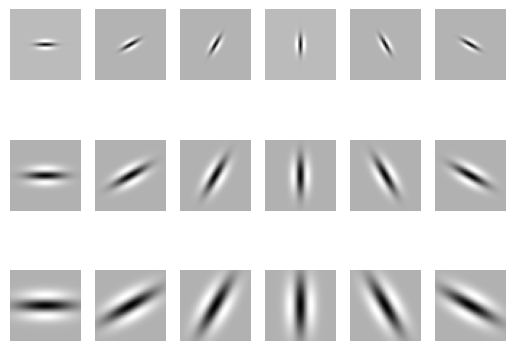

In [62]:
for i in range(0,18):
    plt.subplot(3,6,i+1)
    plt.axis('off')
    plt.imshow(F[:,:,i+18], cmap = 'gray')

## Gaussian and Laplacian Filter

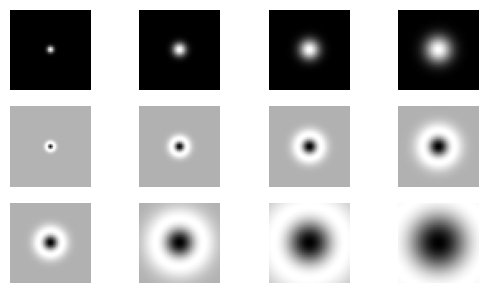

In [63]:
for i in range(0,12):
    plt.subplot(4,4,i+1)
    plt.axis('off')
    plt.imshow(F[:,:,i+36], cmap = 'gray')

# Load images

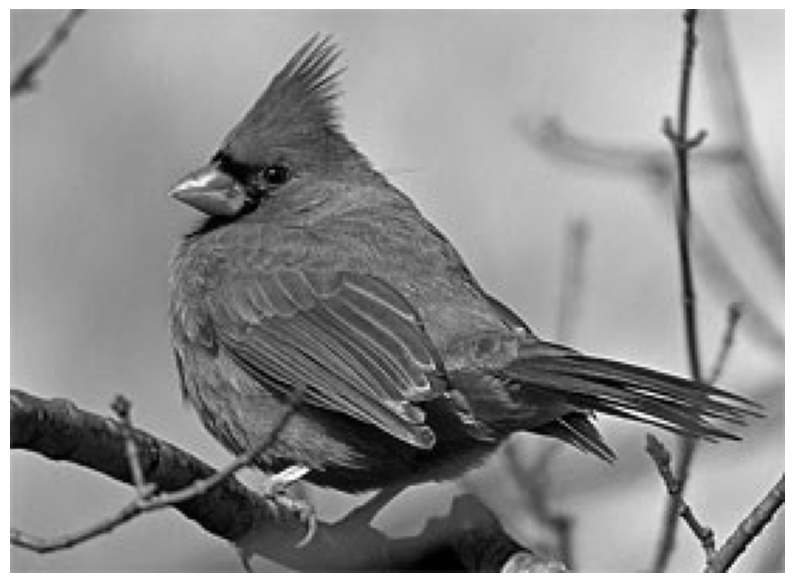

In [64]:
img = cv2.imread('cardinal1.jpg',0)
plt.figure(figsize = [10, 10])
plt.axis('off')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), cmap="gray")

In [65]:
# Load all Images
images = list()

# Birds
images.append(cv2.imread('cardinal1.jpg',0))
images.append(cv2.imread('cardinal2.jpg',0))
images.append(cv2.imread('woodduck1.jpeg',0))
images.append(cv2.imread('woodduck2.jpeg',0))

# Mammals
images.append(cv2.imread('leopard1.jpg',0))
images.append(cv2.imread('leopard2.jpg',0))
images.append(cv2.imread('panda1.jpg',0))
images.append(cv2.imread('panda2.jpg',0))

In [66]:
def makeResponses(img, F):    
    #insert code to compute responses for grayscale images
    
    w, h = img.shape
    _, _, num_filters = F.shape
    responses = np.empty([w, h, num_filters])

    for i in range (0, 48):
        responses[:,:,i] = cv2.filter2D(src = img, ddepth=-1, kernel=F[:,:,i])
    
    return responses

In [67]:
def makeResponses_sep(img, F, vectors):      
    #insert code to compute responses for RBG images    
    w, h = img.shape
    _, _, num_filters = F.shape
    responses = np.empty([w, h, num_filters])
    
    for i in range (0, 16):
        responses[:,:,i] = cv2.sepFilter2D(src = img, ddepth=-1, kernelX=vectors[i], kernelY = vectors[i+16])
    
    return responses

In [80]:
def makeResponses_rgb(img, F):    
    #insert code to compute responses for grayscale images
    
    w, h, ch = img.shape
    _, _, num_filters = F.shape
    responses = np.empty([w, h, ch, num_filters])

    for i in range (0, 48):
        responses[:,:, :,i] = cv2.filter2D(src = img, ddepth=-1, kernel=F[:,:,i])
    
    return responses

In [69]:
def computeMagnitude(img):
    w, h = img.shape
    resolution = w*h

    sum = 0

    # Get the sum of the absolute value of all pixels in image
    sum = np.sum(abs(img))
    
    #sum = np.linalg.norm(img, 1)
    
    return sum/resolution #normalize by image size

In [70]:
def computeMagnitudeRGB(img):
    
    sumVal = 0
    w, h, ch = img.shape
    resolution = w*h

    # Get the sum of the absolute value of all pixels in image
    sum = np.sum(abs(img))

    return sum/resolution #normalize by image size

In [71]:
num_images = len(images)
num_filters = 48

norms = [[0 for i in range(num_images)] for j in range(num_filters)]

image_sums = [0] * 8

sum_norm = 0
sum_norm_mine = 0

# Loop through each image
for i in range (0, num_images):

    # Filter image and store
    FB_responses = makeResponses(images[i], F)
    print(FB_responses.shape, images[i].shape)

    h, w = images[i].shape


    plt.figure(figsize=(20,20))
    plt.suptitle('LM filter responses')
    nr = 12
    nc = 4

    #For each filter...
    for j in range(num_filters):
        #Get magnitude for each filter of each image
        norms[j][i] = computeMagnitude(FB_responses[:,:,j])

        #Get sum of all filtered images
        if(j == 0):
            image_sums[i] = FB_responses[:,:,j]
        else:
            image_sums[i] = FB_responses[:,:,j] + image_sums[i]
    

        #Plot filtered images
        #plt.subplot(nr, nc, j+1)
        #fig = plt.imshow(FB_responses[:,:,j], cmap='gray')
        #fig.axes.get_xaxis().set_visible(False)
        #fig.axes.get_yaxis().set_visible(False)

    #plt.show() 

#print(sum_norm / (h*w))
#print(sum_norm_mine)
#print(np.matrix(norms))

(200, 275, 48) (200, 275)
(302, 398, 48) (302, 398)
(2048, 1536, 48) (2048, 1536)
(2048, 1536, 48) (2048, 1536)
(585, 940, 48) (585, 940)
(1200, 1920, 48) (1200, 1920)
(788, 1400, 48) (788, 1400)
(367, 550, 48) (367, 550)


<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

In [72]:
print(np.matrix(norms))

[[1.5794e+00 8.1464e-01 4.3845e-01 5.0041e-01 1.8699e+00 1.1327e+00
  1.0086e+00 1.2455e+00]
 [1.3468e+00 7.7757e-01 4.0026e-01 4.5296e-01 1.8752e+00 1.1546e+00
  1.0094e+00 1.1461e+00]
 [1.2048e+00 5.6296e-01 3.0309e-01 3.4176e-01 1.9061e+00 1.1334e+00
  9.9642e-01 9.7741e-01]
 [1.2467e+00 3.9228e-01 2.2559e-01 2.7366e-01 1.9078e+00 1.1007e+00
  1.0067e+00 8.5987e-01]
 [1.2751e+00 3.8611e-01 2.4781e-01 3.0590e-01 1.9508e+00 1.1000e+00
  9.9216e-01 8.8021e-01]
 [1.3697e+00 5.3409e-01 3.4372e-01 4.0899e-01 1.9425e+00 1.1515e+00
  9.8318e-01 9.4917e-01]
 [1.0489e+00 5.9543e-01 2.6867e-01 2.9340e-01 1.1504e+00 8.2011e-01
  7.0283e-01 9.8269e-01]
 [8.6151e-01 5.5305e-01 2.4265e-01 2.5906e-01 1.1202e+00 8.4103e-01
  7.1098e-01 8.8825e-01]
 [7.2705e-01 3.9144e-01 1.6475e-01 1.7726e-01 1.1176e+00 8.2538e-01
  7.0206e-01 7.4064e-01]
 [7.3635e-01 2.8307e-01 1.1071e-01 1.3397e-01 1.1395e+00 8.0579e-01
  7.1495e-01 6.4438e-01]
 [7.2765e-01 2.5827e-01 1.1887e-01 1.4931e-01 1.1316e+00 8.1028e-01
  

## Grayscale Thresholds

In [73]:
# Get norms of summed responses
image_norms = [0] * num_images

for i in range (num_images):

    h, w = image_sums[i].shape
    image_norms[i] = np.linalg.norm(image_sums[i], 1) / (h*w)


In [74]:
filter_thresholds = [0] * 49
sum_threshold = 0

bird_norms = [0] * 4
mammal_norms = [0] * 4

bird_norms_sum = [0] * 4
mammal_norms_sum = [0] * 4

for i in range (num_filters):

    #Split norms into birds and mammals
    bird_norms[0] = norms[i][0]
    bird_norms[1] = norms[i][1]
    bird_norms[2] = norms[i][2]
    bird_norms[3] = norms[i][3]

    mammal_norms[0] = norms[i][4]
    mammal_norms[1] = norms[i][5]
    mammal_norms[2] = norms[i][6]
    mammal_norms[3] = norms[i][7]

    # Calculate ideal threshold value
    if(max(bird_norms) < min(mammal_norms)):
        filter_thresholds[i] = (max(bird_norms) + min(mammal_norms)) / 2
    else:
        filter_thresholds[i] = min(mammal_norms)

    printout = "Filter #%d has the following norms:\n birds %s \n mammals %s" % (i, bird_norms, mammal_norms)
    print(printout)

#Summed threshold
bird_norms_sum[0] = image_norms[0]
bird_norms_sum[1] = image_norms[1]
bird_norms_sum[2] = image_norms[2]
bird_norms_sum[3] = image_norms[3]

mammal_norms_sum[0] = image_norms[4]
mammal_norms_sum[1] = image_norms[5]
mammal_norms_sum[2] = image_norms[6]
mammal_norms_sum[3] = image_norms[7]

if(max(bird_norms_sum) < min(mammal_norms_sum)):
    sum_threshold = (max(bird_norms_sum) + min(mammal_norms_sum)) / 2
else:
    sum_threshold = min(mammal_norms_sum)
    
print(filter_thresholds)
print(image_norms)
print(sum_threshold)

Filter #0 has the following norms:
 birds [1.5793636363636363, 0.8146360943791807, 0.4384454091389974, 0.5004142125447592] 
 mammals [1.8698927077650482, 1.1326948784722222, 1.0086085931834663, 1.2455040871934604]
Filter #1 has the following norms:
 birds [1.3468363636363636, 0.7775716329994342, 0.40025901794433594, 0.4529581069946289] 
 mammals [1.8752409529005274, 1.15461328125, 1.0093817984046412, 1.1461233589298985]
Filter #2 has the following norms:
 birds [1.2047818181818182, 0.5629555060068555, 0.3030923207600911, 0.34175745646158856] 
 mammals [1.9061211129296236, 1.1334214409722223, 0.9964204133430021, 0.9774139212286351]
Filter #3 has the following norms:
 birds [1.246690909090909, 0.3922842690272555, 0.22559134165445963, 0.2736552556355794] 
 mammals [1.907766866703037, 1.1007430555555555, 1.0066579042784627, 0.8598662373049294]
Filter #4 has the following norms:
 birds [1.275090909090909, 0.3861110186695065, 0.24781004587809244, 0.30589834849039715] 
 mammals [1.95081105655

Testing Threshold classifier where bird < threshold, mammal > threshold

In [75]:
#store the number of correct classifications for each filter
correct_counts = [0] * 48

for i in range(num_filters):
    for j in range(num_images):
        if(norms[i][j] >= filter_thresholds[i]):
            if(j >= 4):
                correct_counts[i] = correct_counts[i] + 1
            printout = "Theshold states image #%d is a MAMMAL" % j
        else:
            if(j < 4):
                correct_counts[i] = correct_counts[i] + 1
            printout = "Theshold states image #%d is a BIRD" % j
        #print(printout)

average_counts = np.average(correct_counts)
max_counts = max(correct_counts)
min_counts = min(correct_counts)

printout = "Average correct: %d, highest correct: %d, least correct: %d" % (average_counts, max_counts, min_counts)
print(printout)

summed_correct = 0

for i in range(num_images):
    if(image_norms[i] >= sum_threshold):
        if(i >= 4): 
            summed_correct = summed_correct + 1
        printout = "Theshold states image #%d is a MAMMAL" % j
    else:
        if(j < 4):
            summed_correct = summed_correct + 1
        printout = "Theshold states image #%d is a BIRD" % j

printout = "Summed threshold correct: %s" % summed_correct
print(printout)

Average correct: 6, highest correct: 8, least correct: 4
Summed threshold correct: 4


In [76]:
for i in range(num_filters):
    if(correct_counts[i] == 8):
        printout = "Filter #%d classified all correctly" % i
        print(printout)

Filter #14 classified all correctly
Filter #15 classified all correctly
Filter #16 classified all correctly


# Try in RGB (Color) Format

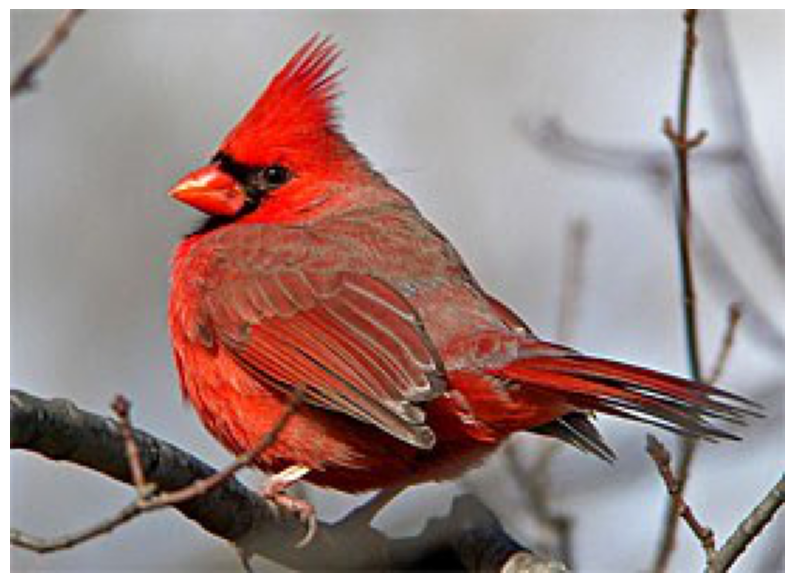

In [77]:
img = cv2.imread('cardinal1.jpg')
plt.figure(figsize = [10, 10])
plt.axis('off')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [78]:
# Load all Images
images_rgb = list()

# Birds
images_rgb.append(cv2.imread('cardinal1.jpg',1))
images_rgb.append(cv2.imread('cardinal2.jpg',1))
images_rgb.append(cv2.imread('woodduck1.jpeg',1))
images_rgb.append(cv2.imread('woodduck2.jpeg',1))

# Mammals
images_rgb.append(cv2.imread('leopard1.jpg',1))
images_rgb.append(cv2.imread('leopard2.jpg',1))
images_rgb.append(cv2.imread('panda1.jpg',1))
images_rgb.append(cv2.imread('panda2.jpg',1))

(200, 275, 3, 48) (200, 275, 3)


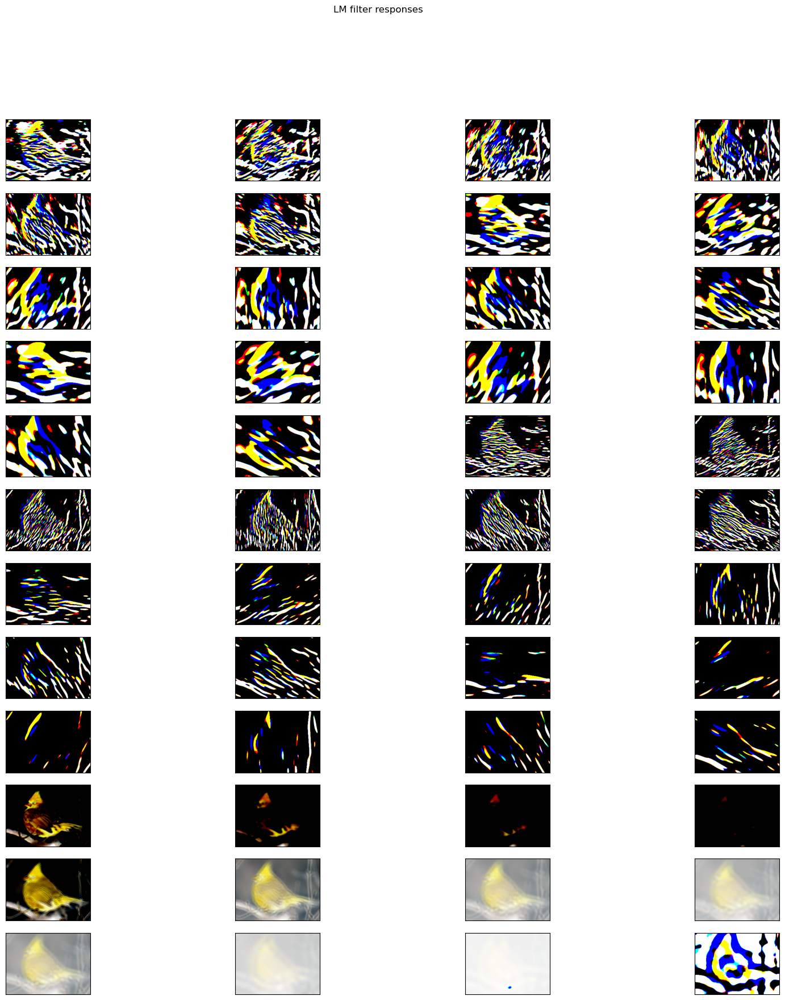

(302, 398, 3, 48) (302, 398, 3)


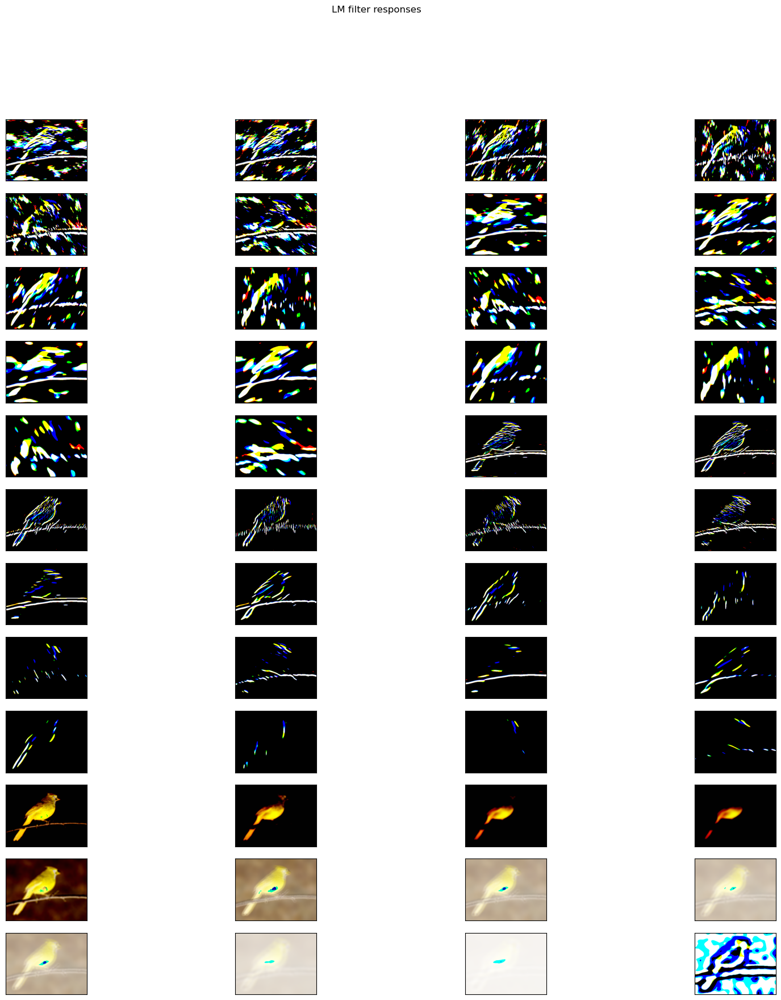

(2048, 1536, 3, 48) (2048, 1536, 3)


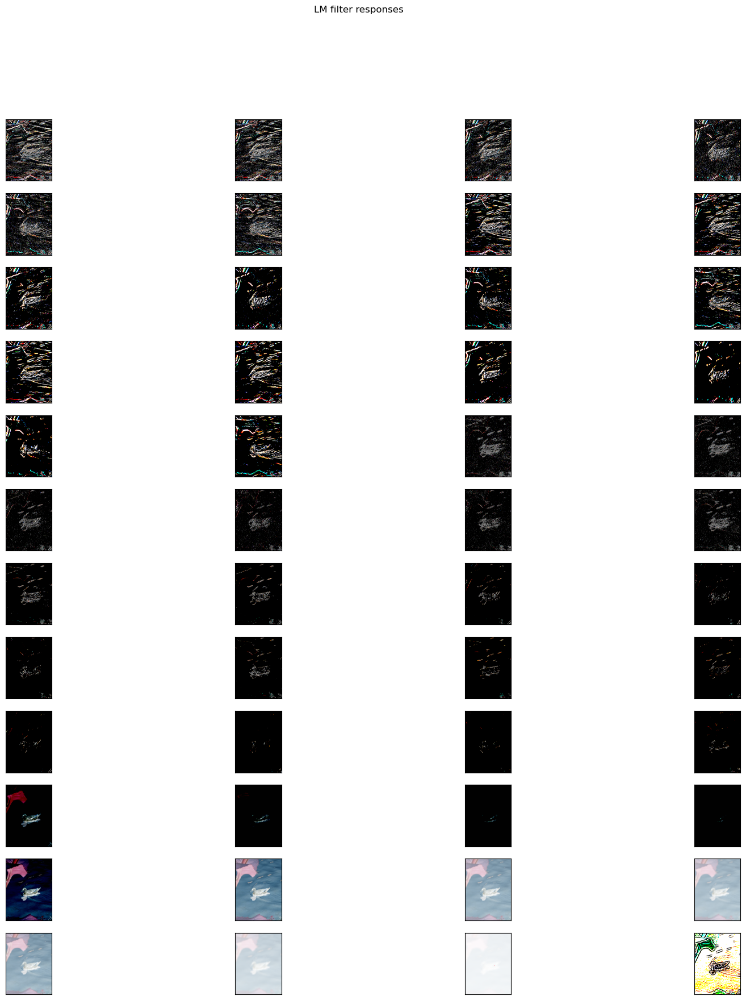

(2048, 1536, 3, 48) (2048, 1536, 3)


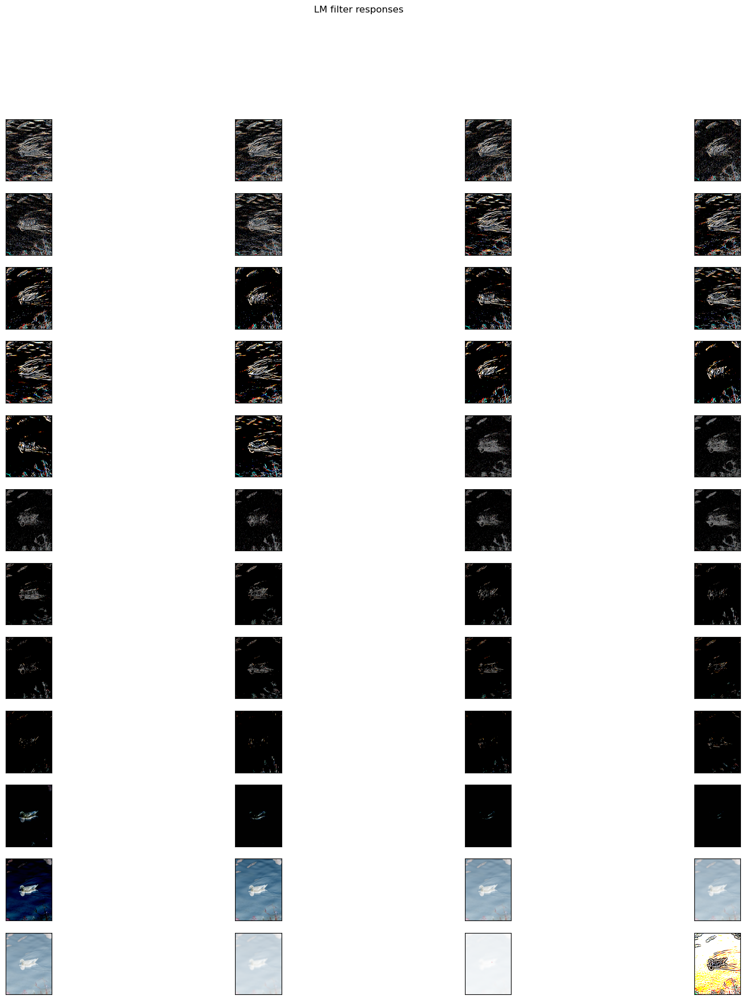

(585, 940, 3, 48) (585, 940, 3)


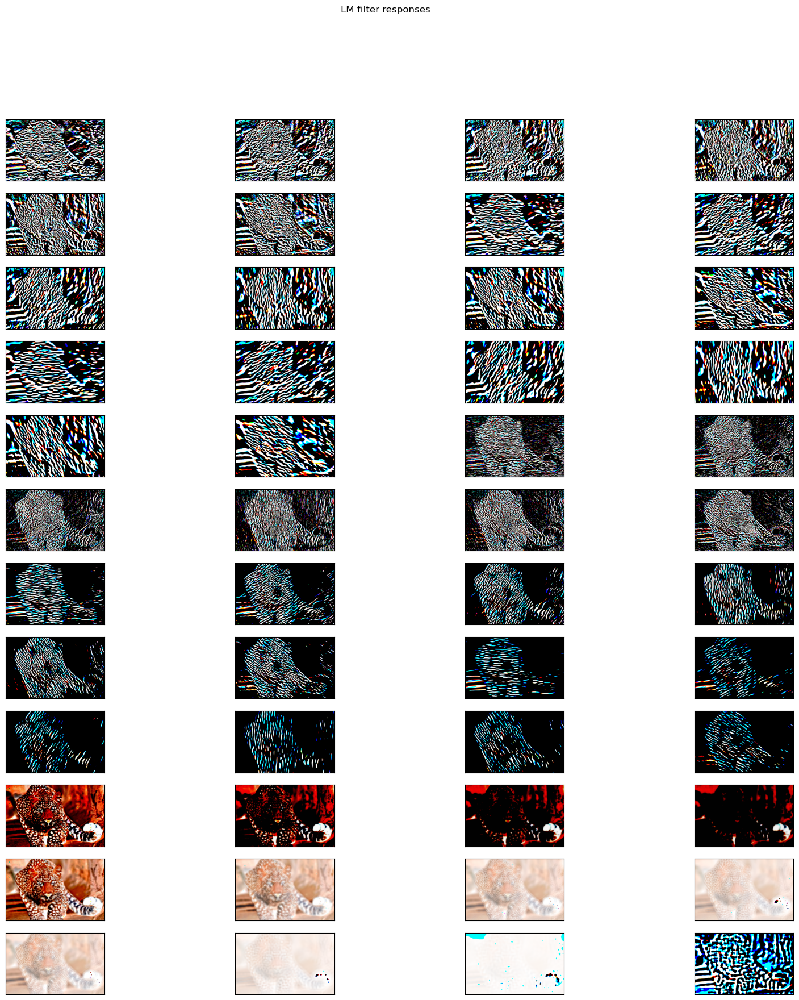

(1200, 1920, 3, 48) (1200, 1920, 3)


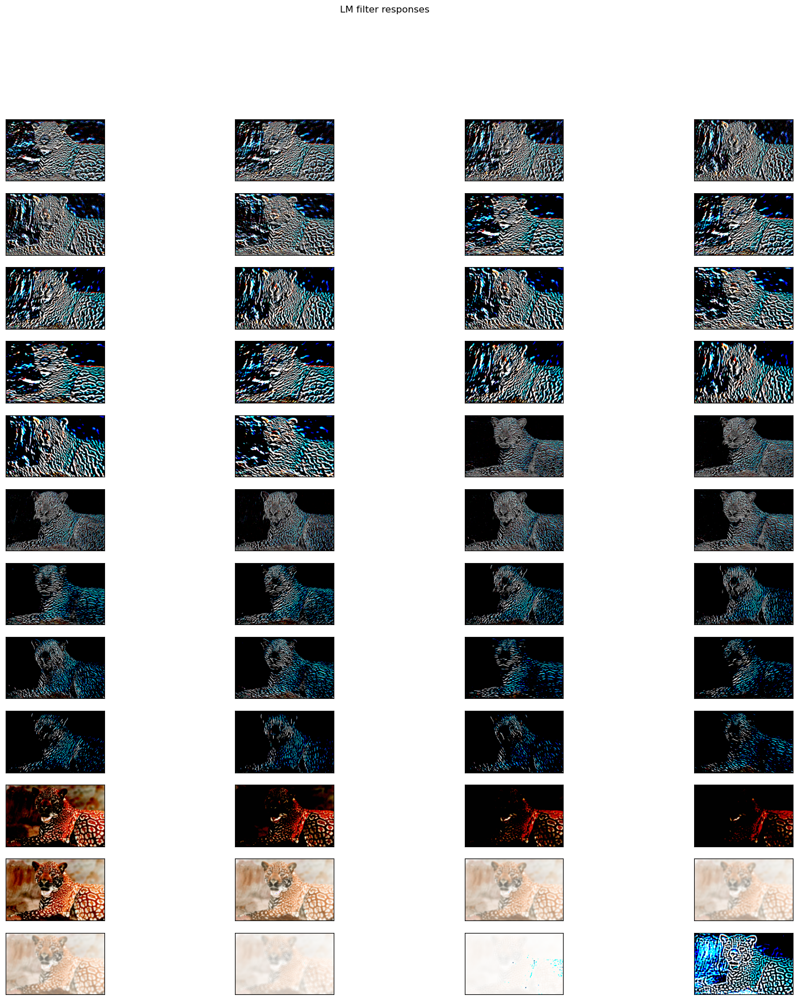

(788, 1400, 3, 48) (788, 1400, 3)


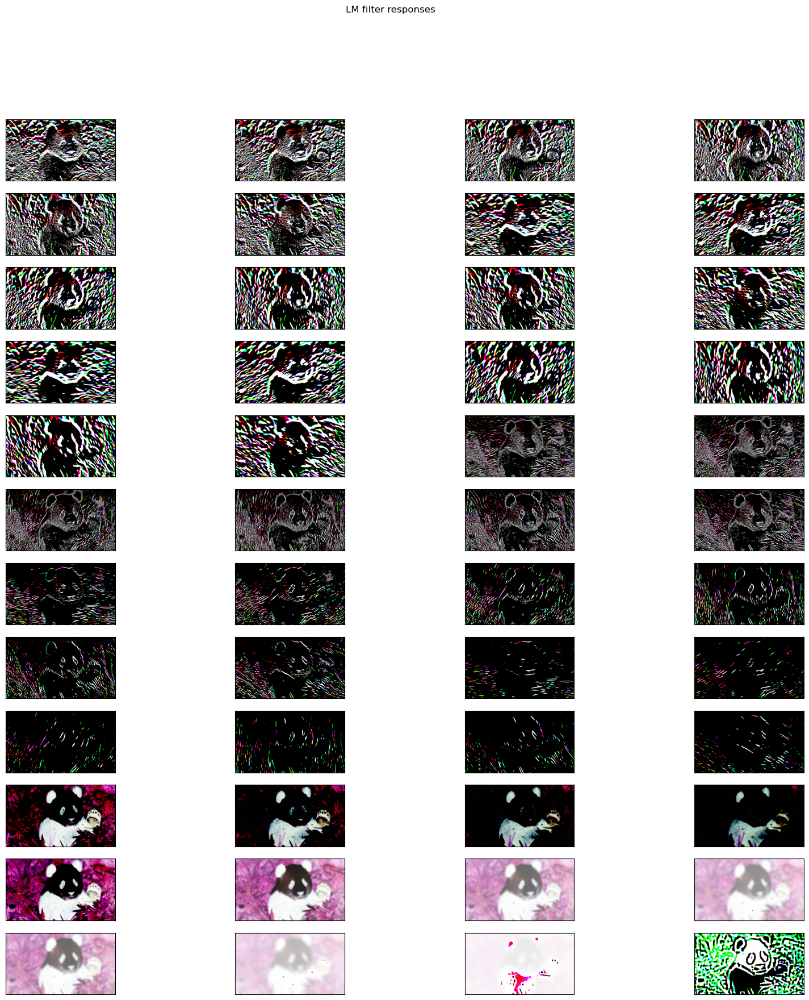

(367, 550, 3, 48) (367, 550, 3)


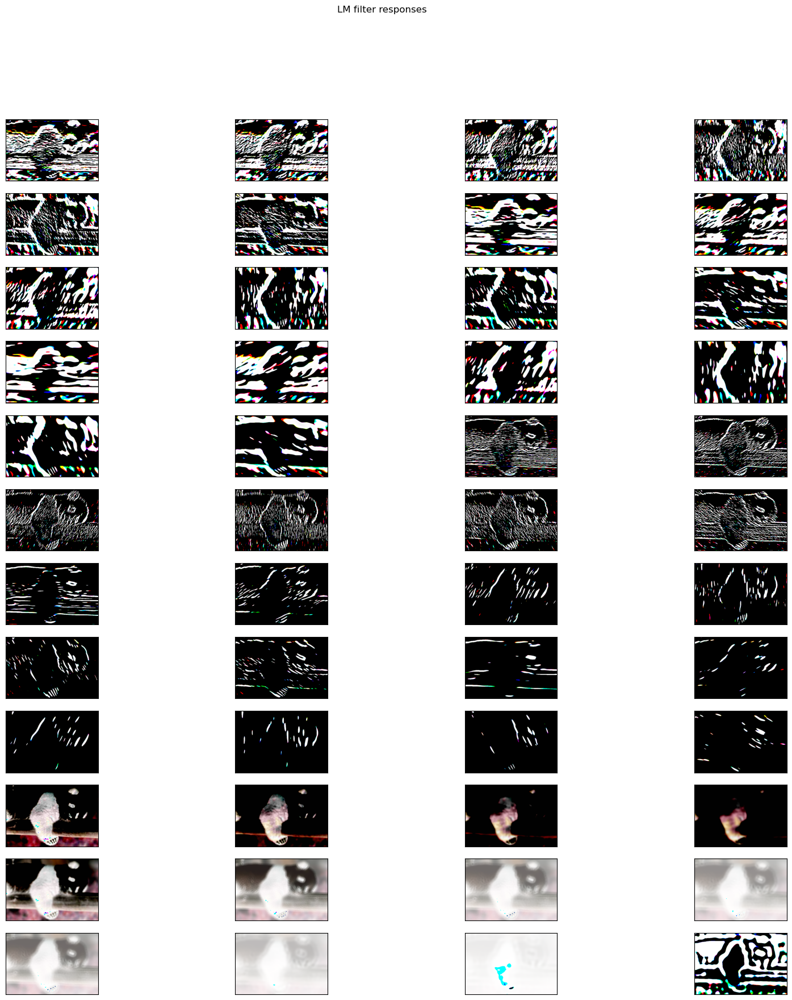

In [81]:
norms = [[0 for i in range(8)] for j in range(48)]

image_sums = [0] * 8

# Loop through each image
for i in range (num_images):

    # Filter image and store
    w, h, ch = images_rgb[i].shape
    _, _, num_filters = F.shape
    FB_responses = makeResponses_rgb(images_rgb[i], F)

    print(FB_responses.shape, images_rgb[i].shape)

    plt.figure(figsize=(20,20))
    plt.suptitle('LM filter responses')
    nr = 12
    nc = 4

    #For each filter...
    for j in range(num_filters):
        #Get magnitude for each filter of each image
        norms[j][i] = (computeMagnitudeRGB(FB_responses[:,:,:,j]))

        #Get sum of all filtered images
        if(j == 0):
            image_sums[i] = FB_responses[:,:,:,j]
        else:
            image_sums[i] = FB_responses[:,:,:,j] + image_sums[i]

        #Plot filtered images
        plt.subplot(nr, nc, j+1)
        fig = plt.imshow((FB_responses[:,:,:,j] * 255).astype(np.uint8))
        fig.axes.get_xaxis().set_visible(False)
        fig.axes.get_yaxis().set_visible(False)

    plt.show() 

#print(np.matrix(norms))

## Thresholds for RGB images

In [ ]:
# Get norms of summed responses
image_norms = [0] * num_images


for i in range (num_images):
    w, h, ch = images_rgb[i].shape
    resolution = w*h
    image_norms[i] = np.sum(abs(image_sums[i]))/resolution

print(image_norms)

[4871.357090909091, 4752.825851109854, 4922.892136891683, 5025.652848243713, 3832.031067466812, 4112.056933159723, 4081.0276078680204, 4163.959033936091]


In [ ]:
filter_thresholds = [0] * 49
sum_threshold = 0

bird_norms = [0] * 4
mammal_norms = [0] * 4

bird_norms_sum = [0] * 4
mammal_norms_sum = [0] * 4

for i in range (num_filters):

    #Split norms into birds and mammals
    bird_norms[0] = norms[i][0]
    bird_norms[1] = norms[i][1]
    bird_norms[2] = norms[i][2]
    bird_norms[3] = norms[i][3]

    mammal_norms[0] = norms[i][4]
    mammal_norms[1] = norms[i][5]
    mammal_norms[2] = norms[i][6]
    mammal_norms[3] = norms[i][7]

    # Calculate ideal threshold value
    if(max(bird_norms) < min(mammal_norms)):
        filter_thresholds[i] = (max(bird_norms) + min(mammal_norms)) / 2
    else:
        filter_thresholds[i] = min(mammal_norms)

    printout = "Filter #%d has the following norms:\n birds %s \n mammals %s" % (i, bird_norms, mammal_norms)
    print(printout)

#Summed threshold
bird_norms_sum[0] = image_norms[0]
bird_norms_sum[1] = image_norms[1]
bird_norms_sum[2] = image_norms[2]
bird_norms_sum[3] = image_norms[3]

mammal_norms_sum[0] = image_norms[4]
mammal_norms_sum[1] = image_norms[5]
mammal_norms_sum[2] = image_norms[6]
mammal_norms_sum[3] = image_norms[7]

if(max(bird_norms_sum) < min(mammal_norms_sum)):
    sum_threshold = (max(bird_norms_sum) + min(mammal_norms_sum)) / 2
else:
    sum_threshold = min(mammal_norms_sum)
    
print(filter_thresholds)
print(sum_threshold)

Filter #0 has the following norms:
 birds [5.077036363636363, 2.4731937834869715, 1.3591200510660808, 1.5362488428751628] 
 mammals [5.371705764684488, 3.2363980034722224, 3.1209191443074693, 3.77159772108001]
Filter #1 has the following norms:
 birds [4.3978, 2.368706113348198, 1.239296277364095, 1.3882598876953125] 
 mammals [5.374839061647572, 3.2905876736111113, 3.1234109862219, 3.465310874411692]
Filter #2 has the following norms:
 birds [3.994327272727273, 1.717661153449366, 0.9413544336954752, 1.0508257548014324] 
 mammals [5.453296963084197, 3.2327421875, 3.0786430384336474, 2.9566955660143672]
Filter #3 has the following norms:
 birds [4.125381818181818, 1.2003976837831543, 0.7070344289143881, 0.843354860941569] 
 mammals [5.459408983451537, 3.144774739583333, 3.107391225525743, 2.6000941293039386]
Filter #4 has the following norms:
 birds [4.158472727272727, 1.2020449931778097, 0.768975575764974, 0.9361321131388346] 
 mammals [5.596917621385707, 3.1429305555555556, 3.07210206

In [ ]:
#store the number of correct classifications for each filter
correct_counts = [0] * 48

for i in range(num_filters):
    for j in range(num_images):
        if(norms[i][j] >= filter_thresholds[i]):
            if(j >= 4):
                correct_counts[i] = correct_counts[i] + 1
            printout = "Theshold states image #%d is a MAMMAL" % j
        else:
            if(j < 4):
                correct_counts[i] = correct_counts[i] + 1
            printout = "Theshold states image #%d is a BIRD" % j
        print(printout)

average_counts = np.average(correct_counts)
max_counts = max(correct_counts)
min_counts = min(correct_counts)

printout = "Average correct: %d, highest correct: %d, least correct: %d" % (average_counts, max_counts, min_counts)
print(printout)

Theshold states image #0 is a MAMMAL
Theshold states image #1 is a BIRD
Theshold states image #2 is a BIRD
Theshold states image #3 is a BIRD
Theshold states image #4 is a MAMMAL
Theshold states image #5 is a MAMMAL
Theshold states image #6 is a MAMMAL
Theshold states image #7 is a MAMMAL
Theshold states image #0 is a MAMMAL
Theshold states image #1 is a BIRD
Theshold states image #2 is a BIRD
Theshold states image #3 is a BIRD
Theshold states image #4 is a MAMMAL
Theshold states image #5 is a MAMMAL
Theshold states image #6 is a MAMMAL
Theshold states image #7 is a MAMMAL
Theshold states image #0 is a MAMMAL
Theshold states image #1 is a BIRD
Theshold states image #2 is a BIRD
Theshold states image #3 is a BIRD
Theshold states image #4 is a MAMMAL
Theshold states image #5 is a MAMMAL
Theshold states image #6 is a MAMMAL
Theshold states image #7 is a MAMMAL
Theshold states image #0 is a MAMMAL
Theshold states image #1 is a BIRD
Theshold states image #2 is a BIRD
Theshold states image #

In [ ]:
for i in range(num_filters):
    if(correct_counts[i] == 8):
        printout = "Filter #%d classified all correctly" % i
        print(printout)

## Comparing Separable vs. Non-Separable compute times

In [ ]:
# Get separable filter arrays for filters 0, 3, 6, 9, 12, 15, 18, 21, 24, 27, 30, 33, 36, 37, 38, 39

sep_list = [0, 3, 6, 9, 12, 15, 18, 21, 24, 27, 30, 33, 36, 37, 38, 39]

# i = kernelX, i + len(sep_list) = kernelY
filter_vectors = [0] * len(sep_list)*2


index = 0

for i in (sep_list):
    U, E, V = np.linalg.svd(F[:,:,i])

    VT = np.transpose(V) 

    kernelX = np.sqrt(E[0]) * U[0]
    kernelY = np.sqrt(E[0]) * VT[0]

    filter_vectors[index] = kernelX
    filter_vectors[index + len(sep_list)] = kernelY

    index = index + 1


Filter grayscale images with non-separated separable filters only

(200, 275, 48) (200, 275)


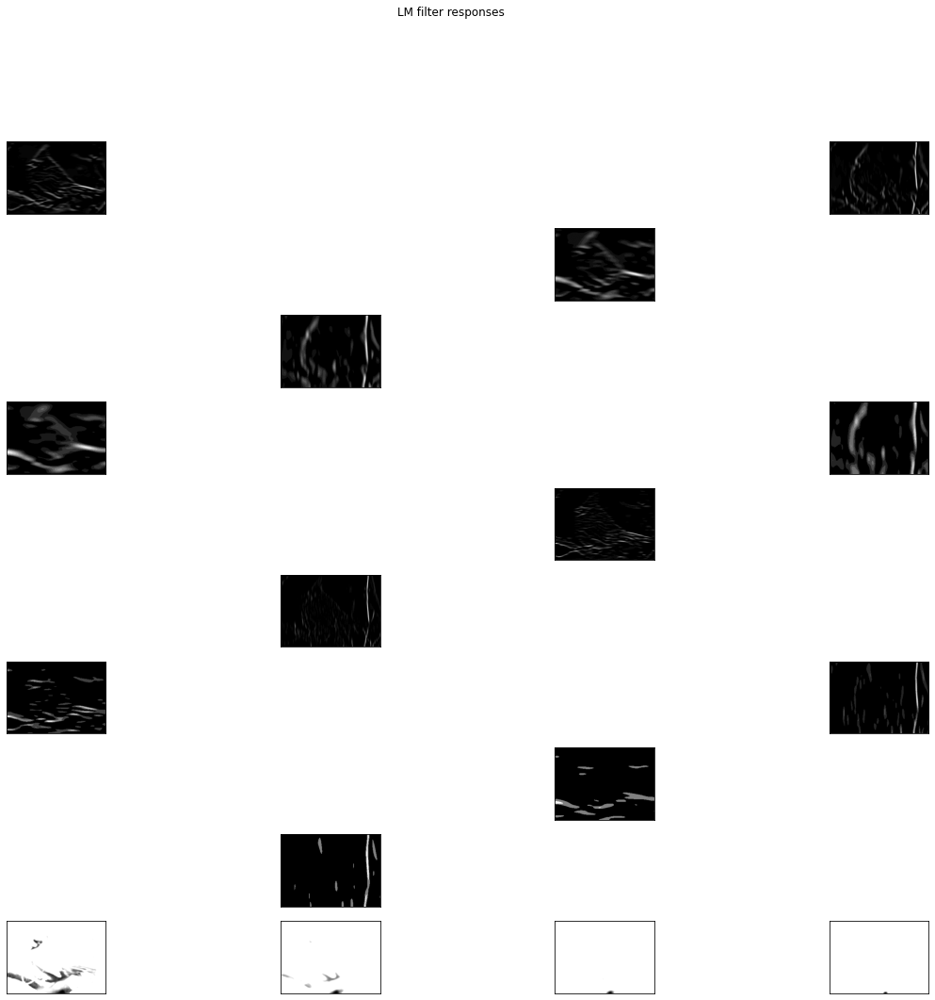

(302, 398, 48) (302, 398)


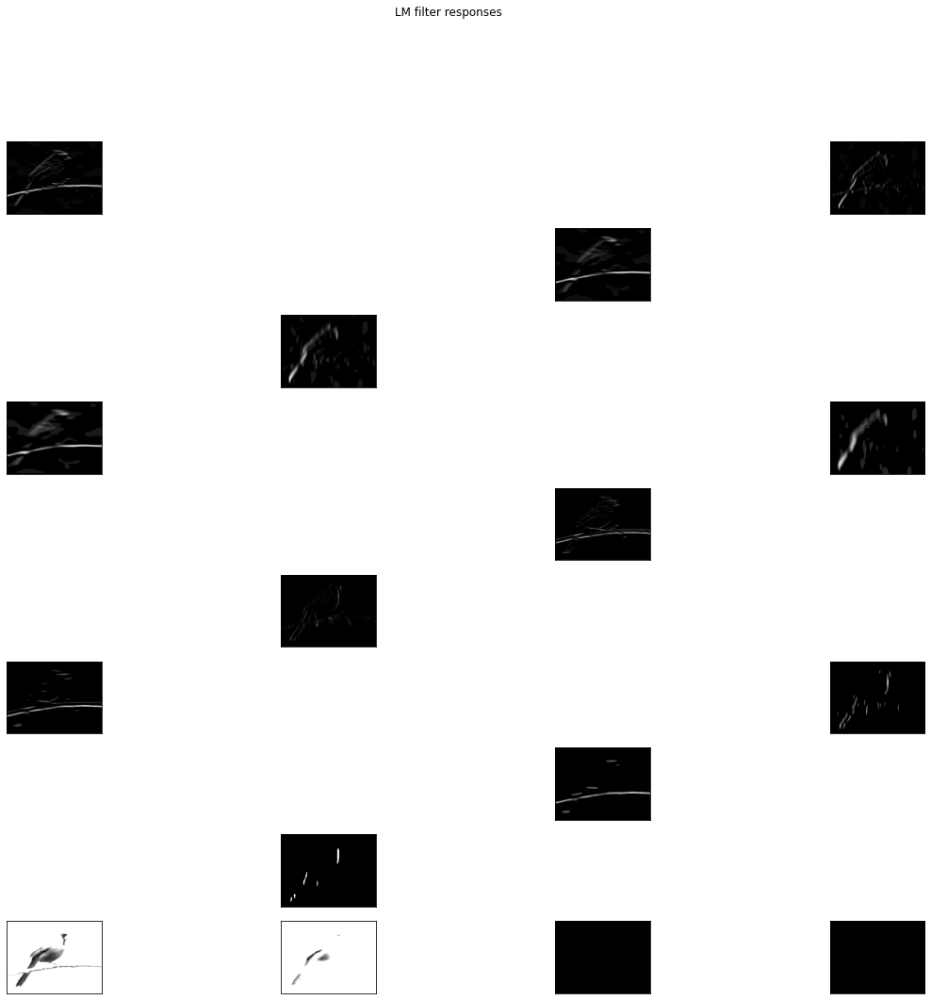

(2048, 1536, 48) (2048, 1536)


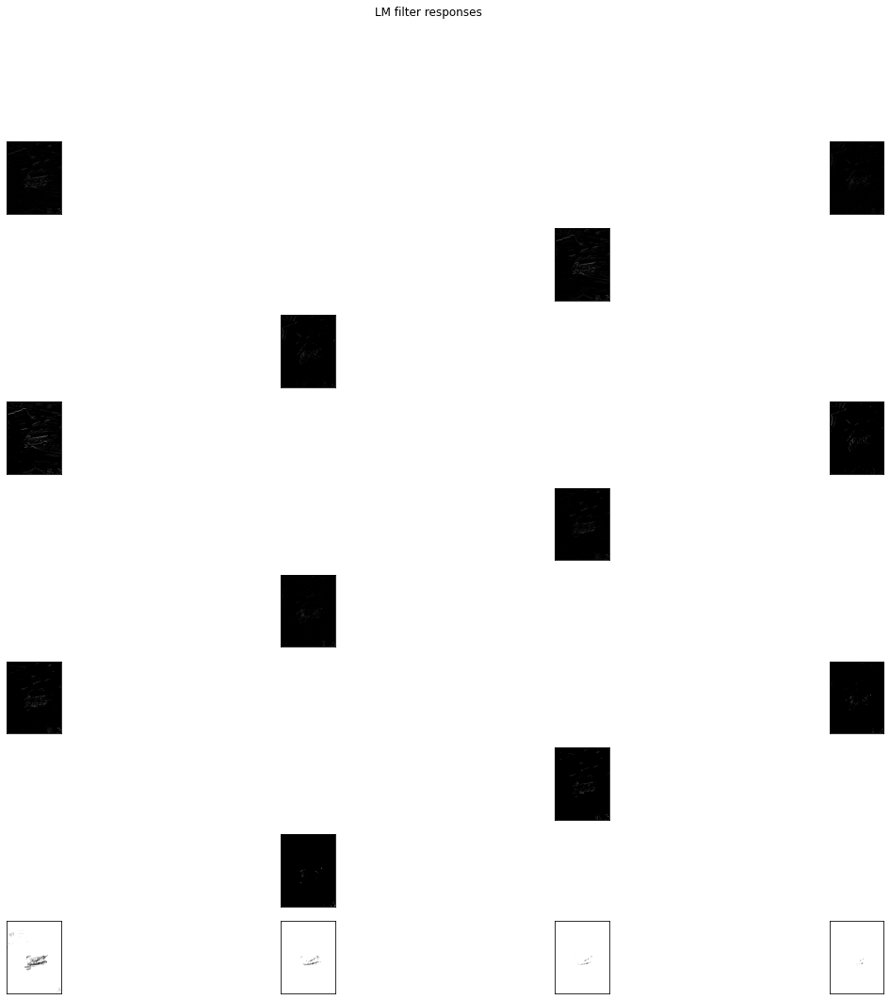

(2048, 1536, 48) (2048, 1536)


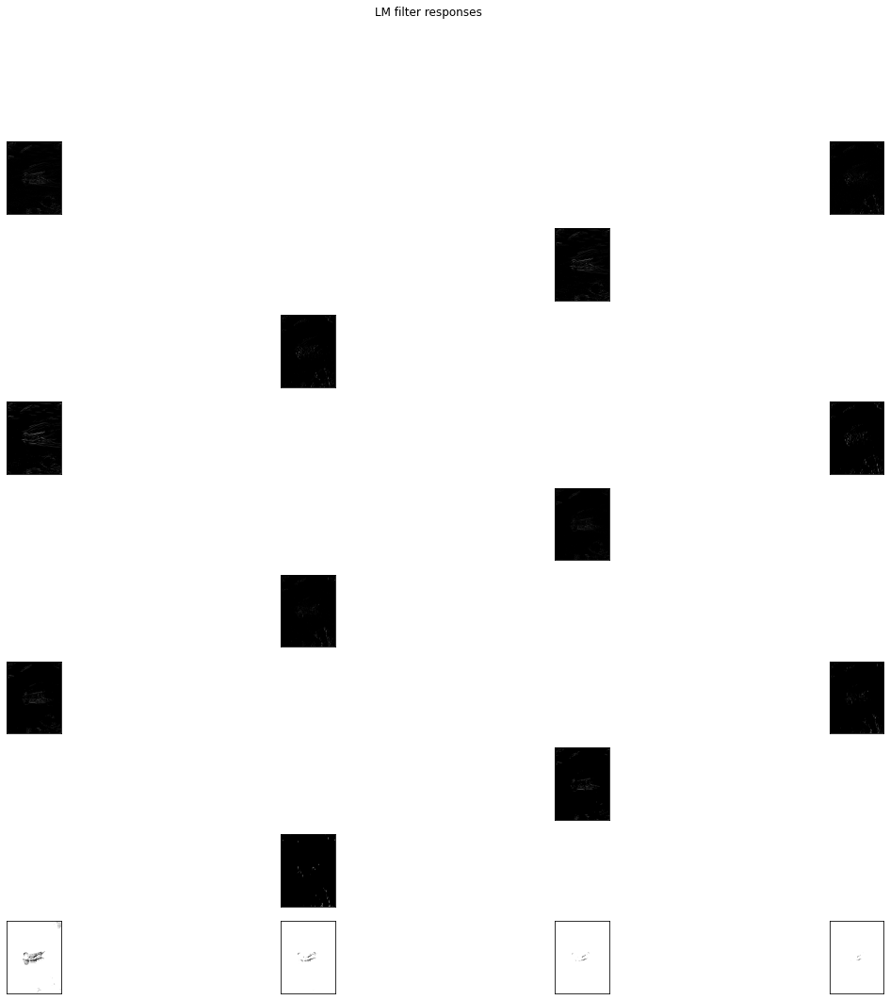

(585, 940, 48) (585, 940)


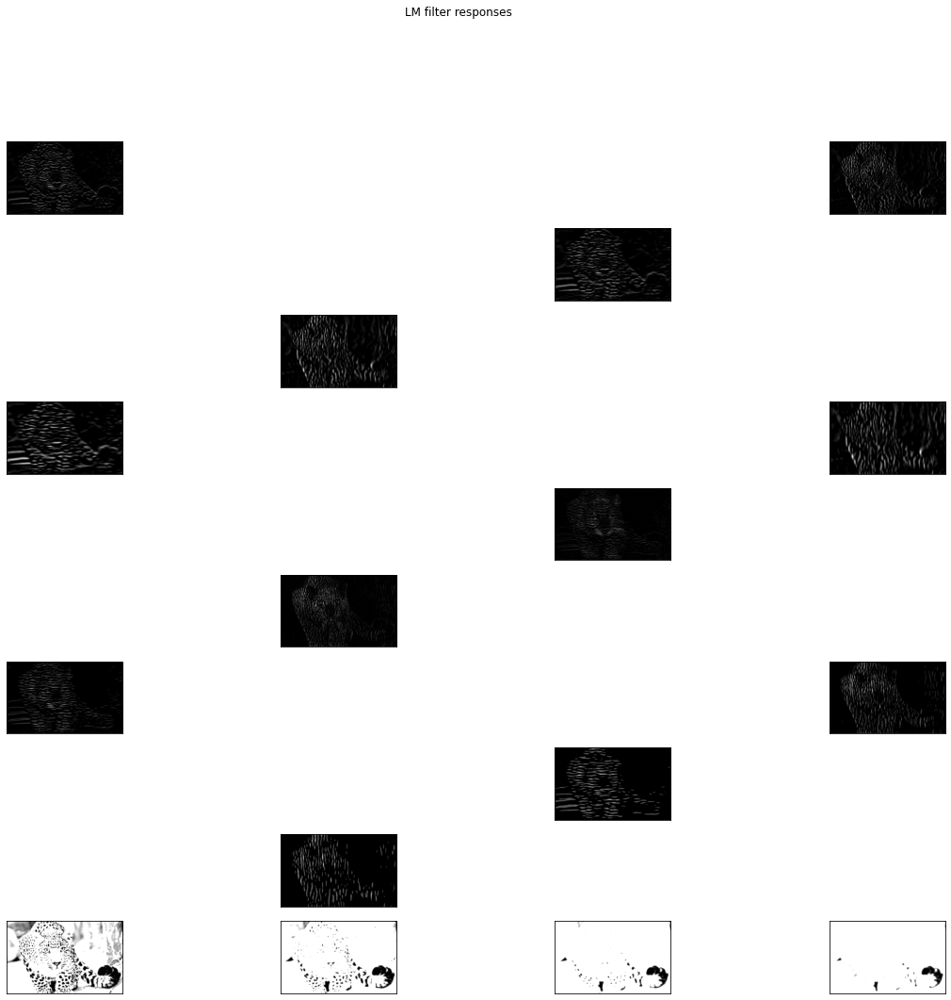

(1200, 1920, 48) (1200, 1920)


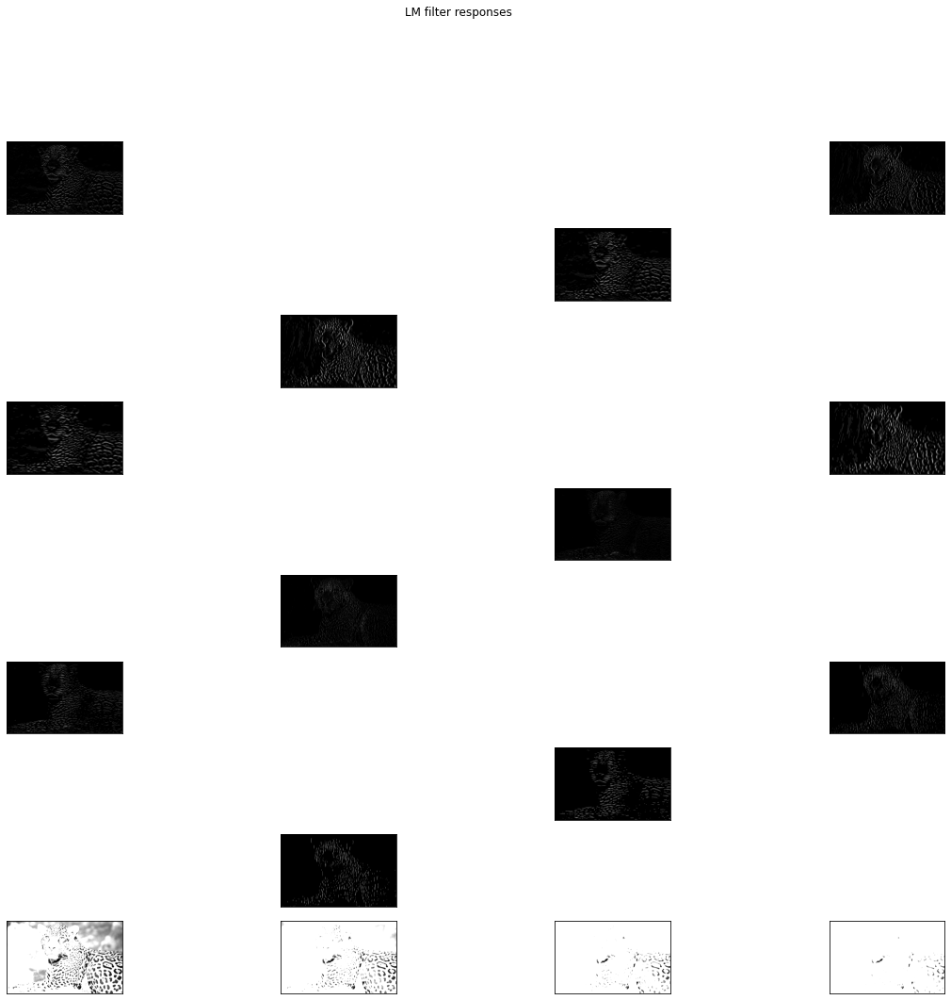

(788, 1400, 48) (788, 1400)


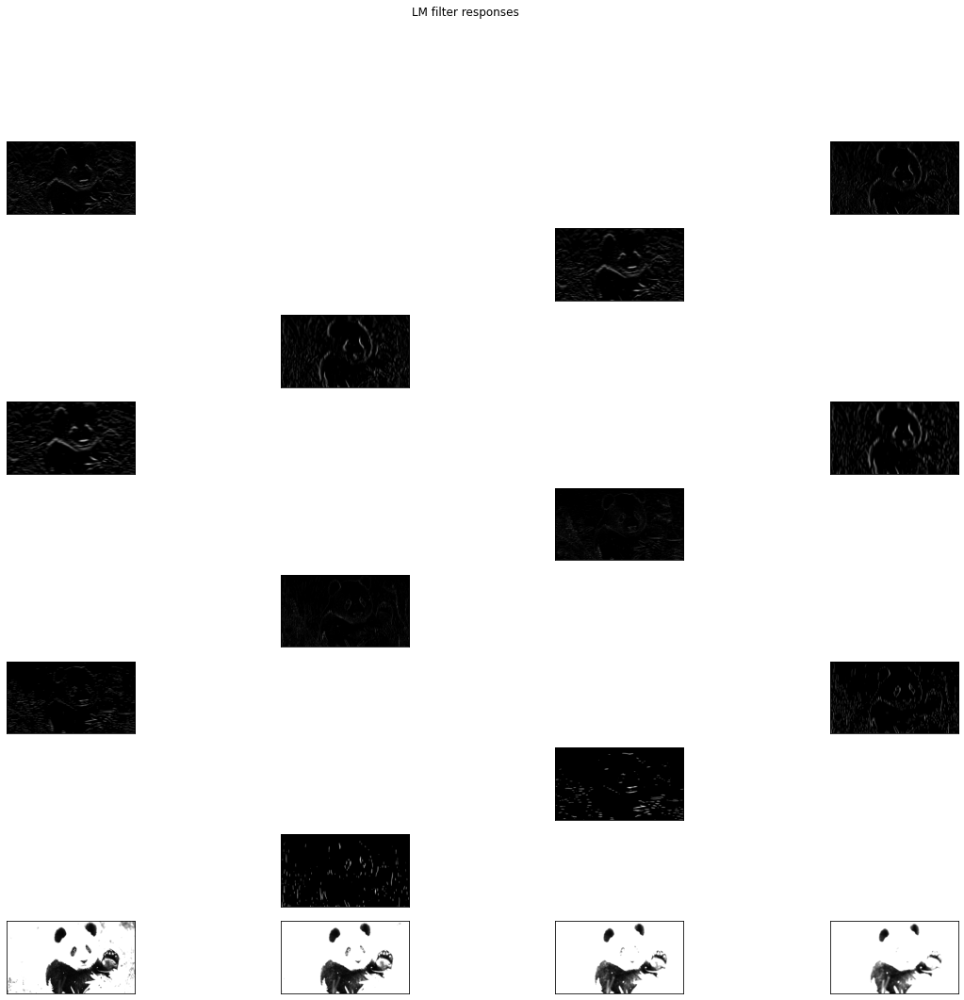

(367, 550, 48) (367, 550)


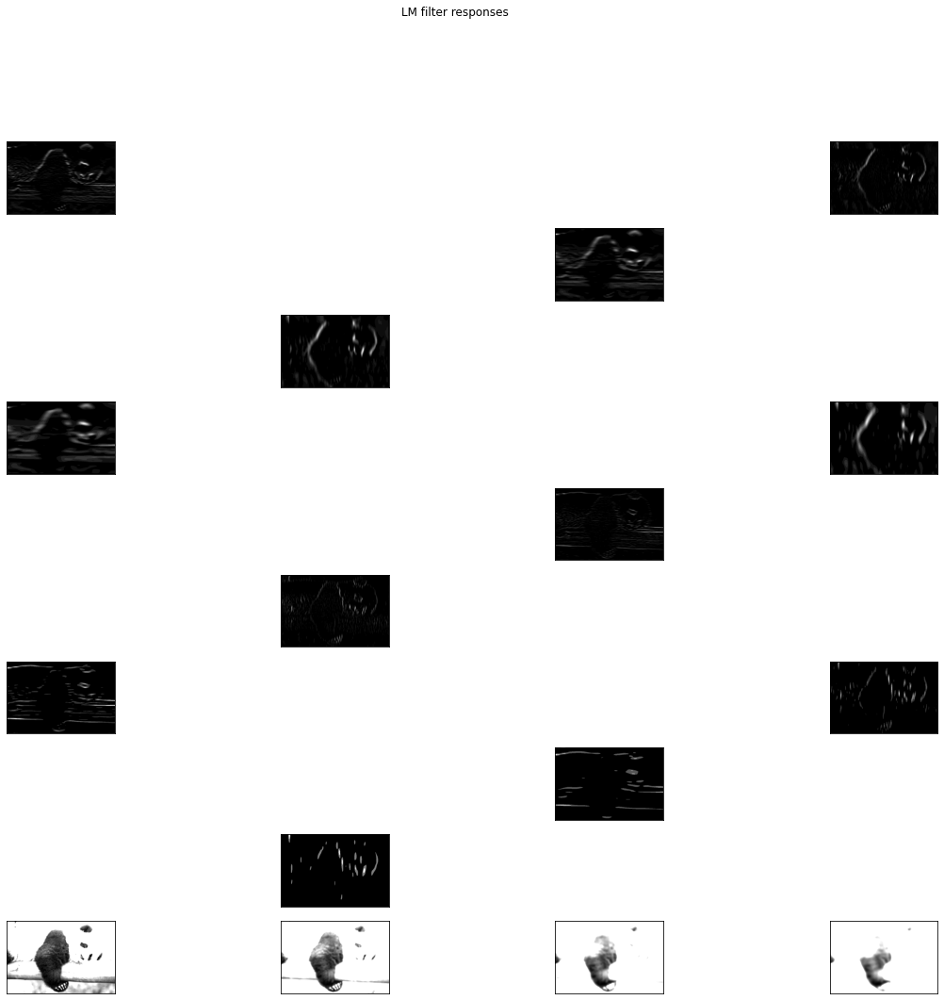

In [ ]:
num_images = len(images)
num_filters = 48


# Loop through each image
for i in range (0, num_images):

    # Filter image and store
    FB_responses = makeResponses(images[i], F)
    print(FB_responses.shape, images[i].shape)

    plt.figure(figsize=(20,20))
    plt.suptitle('LM filter responses')
    nr = 12
    nc = 4

    #For each filter...
    for j in sep_list:
        
        #Plot filtered images
        plt.subplot(nr, nc, j+1)
        fig = plt.imshow(FB_responses[:,:,j], cmap='gray')
        fig.axes.get_xaxis().set_visible(False)
        fig.axes.get_yaxis().set_visible(False)

    plt.show() 

#print(np.matrix(norms))

Separated separable filters

(200, 275, 48) (200, 275)


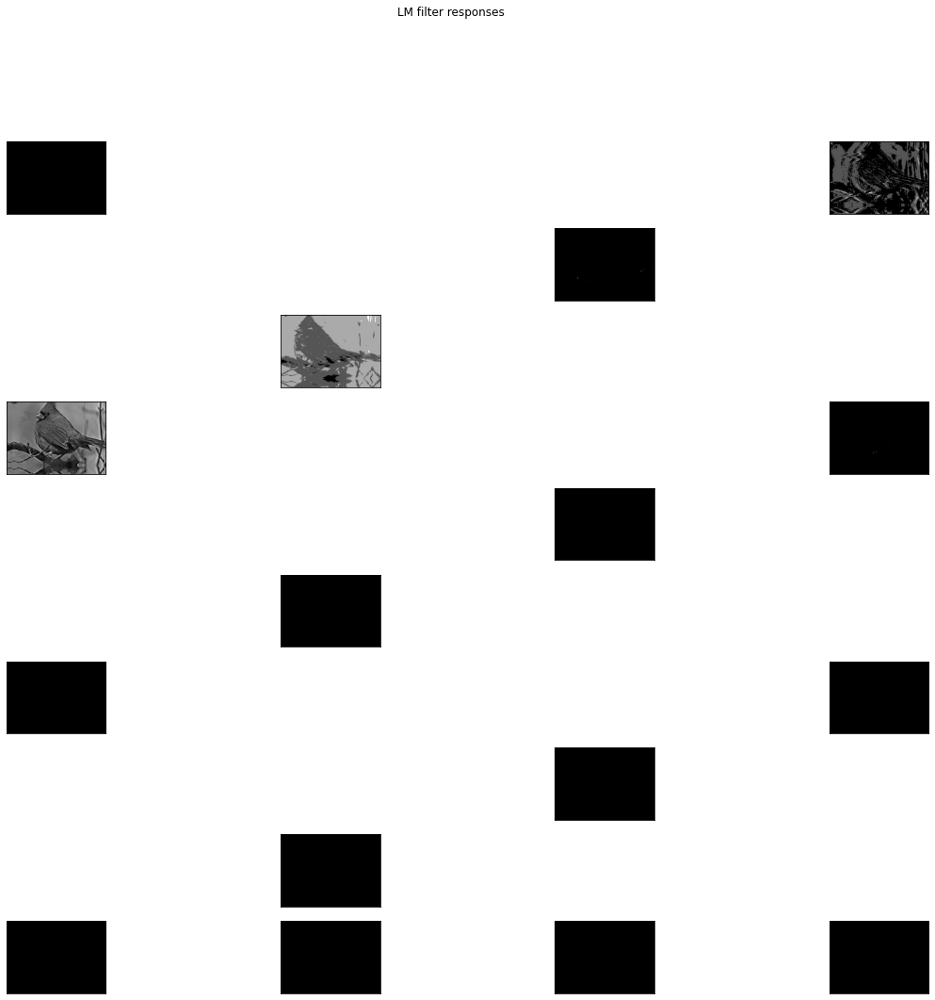

(302, 398, 48) (302, 398)


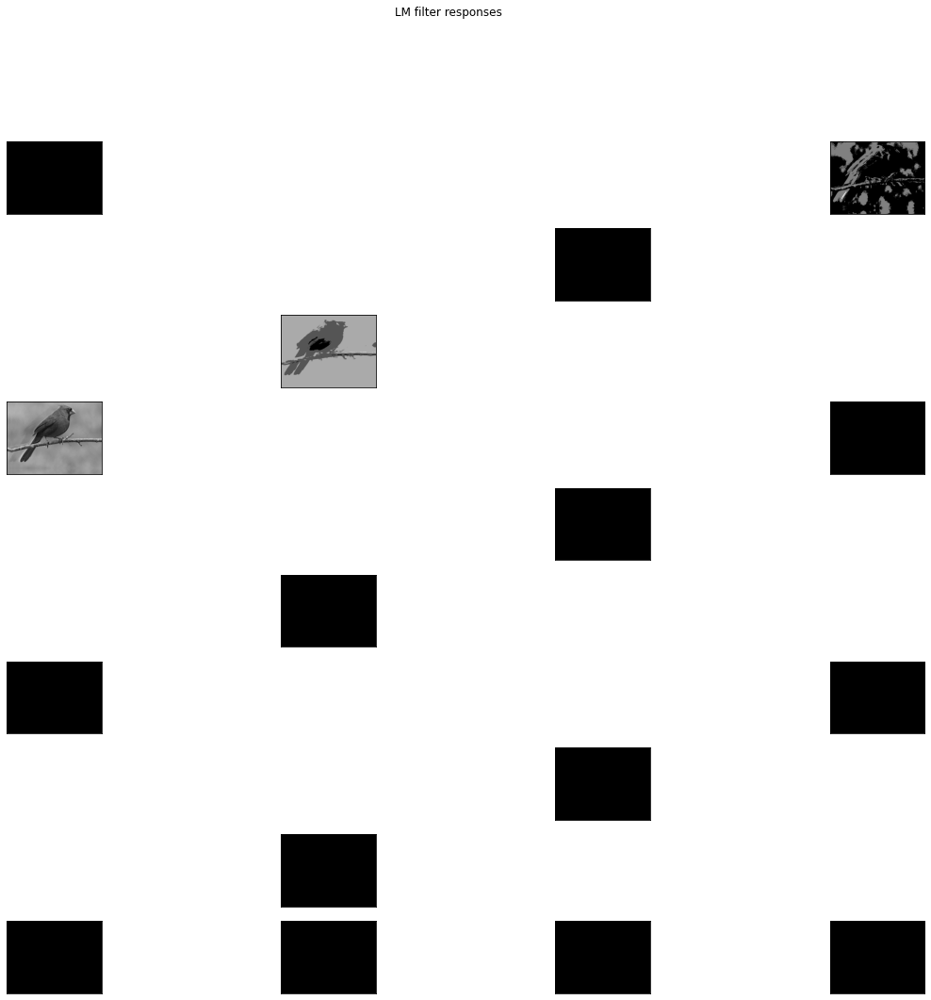

(2048, 1536, 48) (2048, 1536)


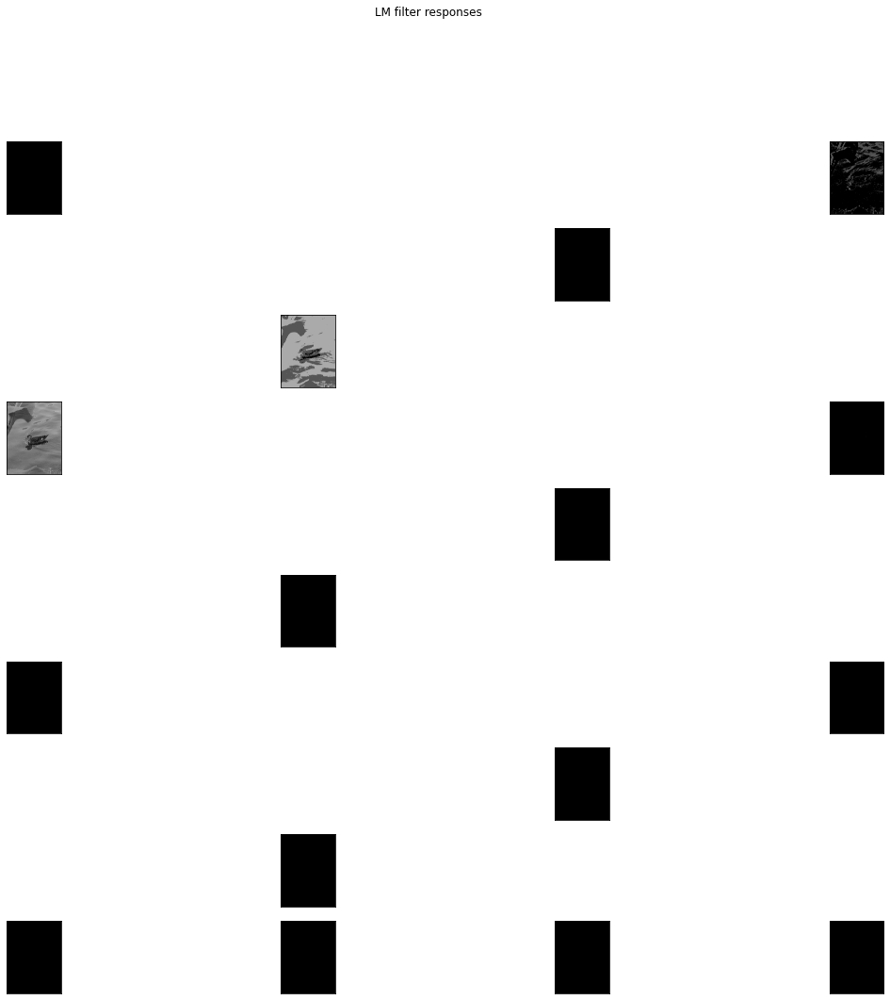

(2048, 1536, 48) (2048, 1536)


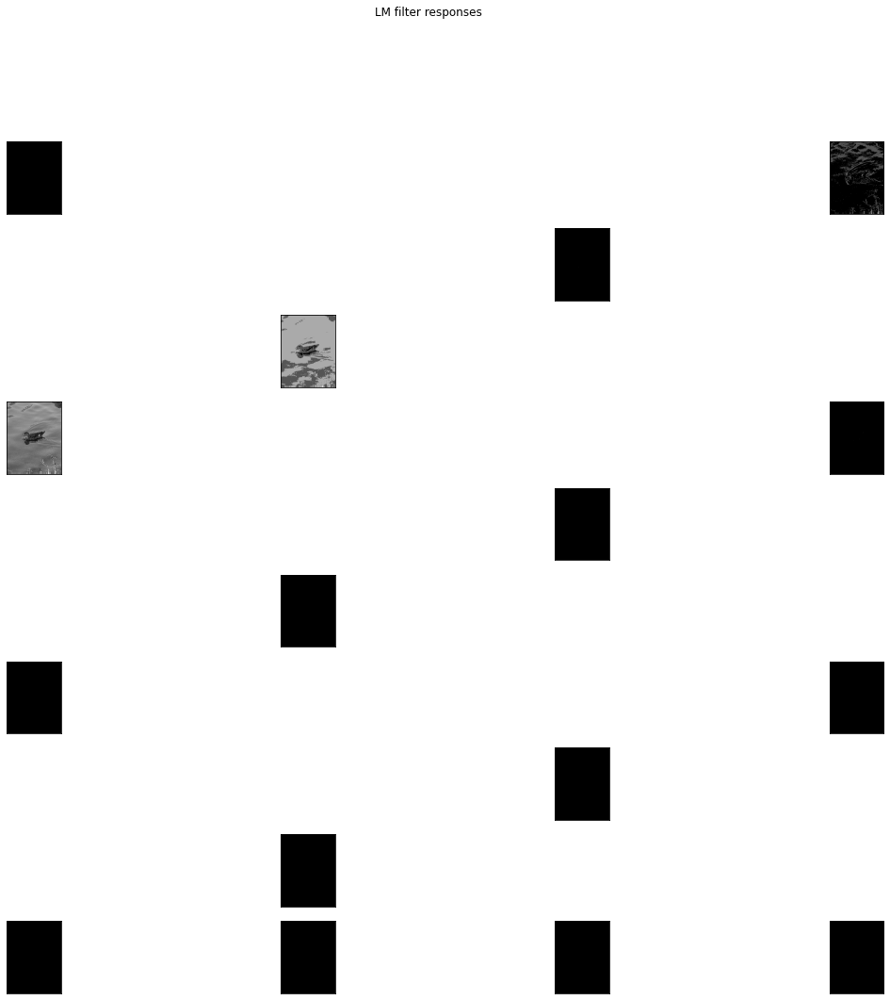

(585, 940, 48) (585, 940)


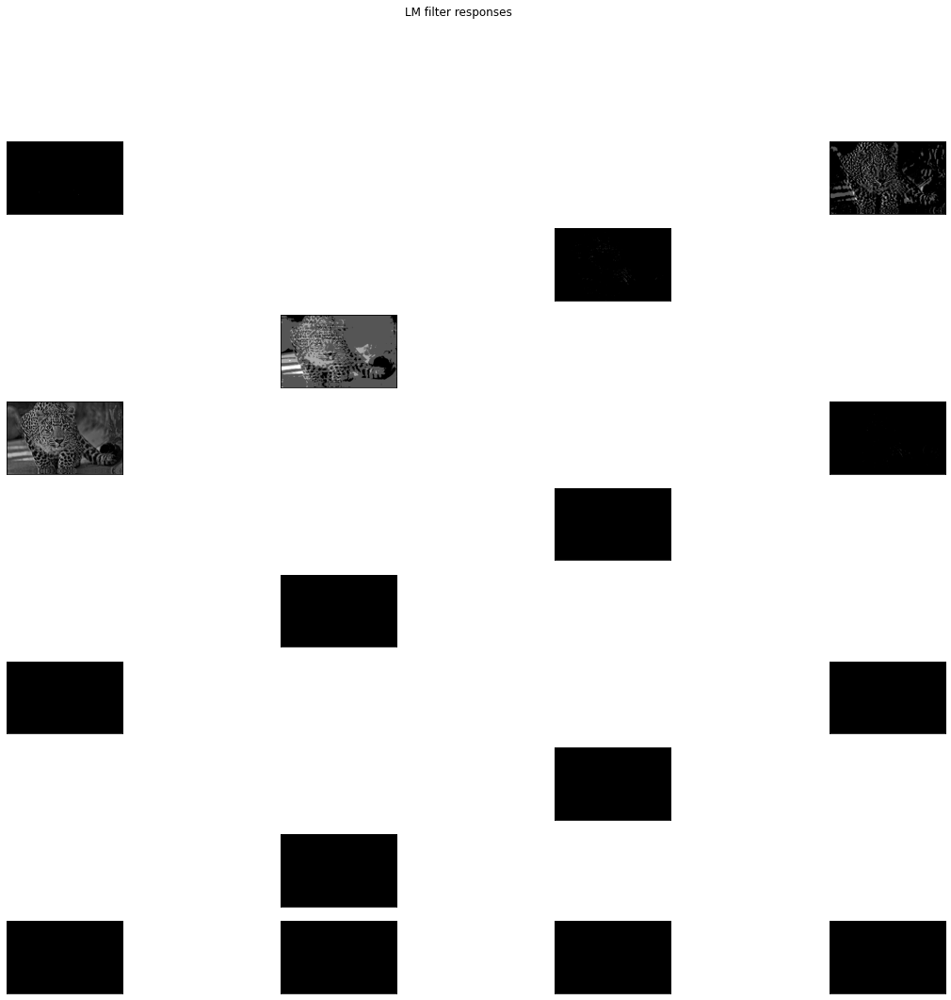

(1200, 1920, 48) (1200, 1920)


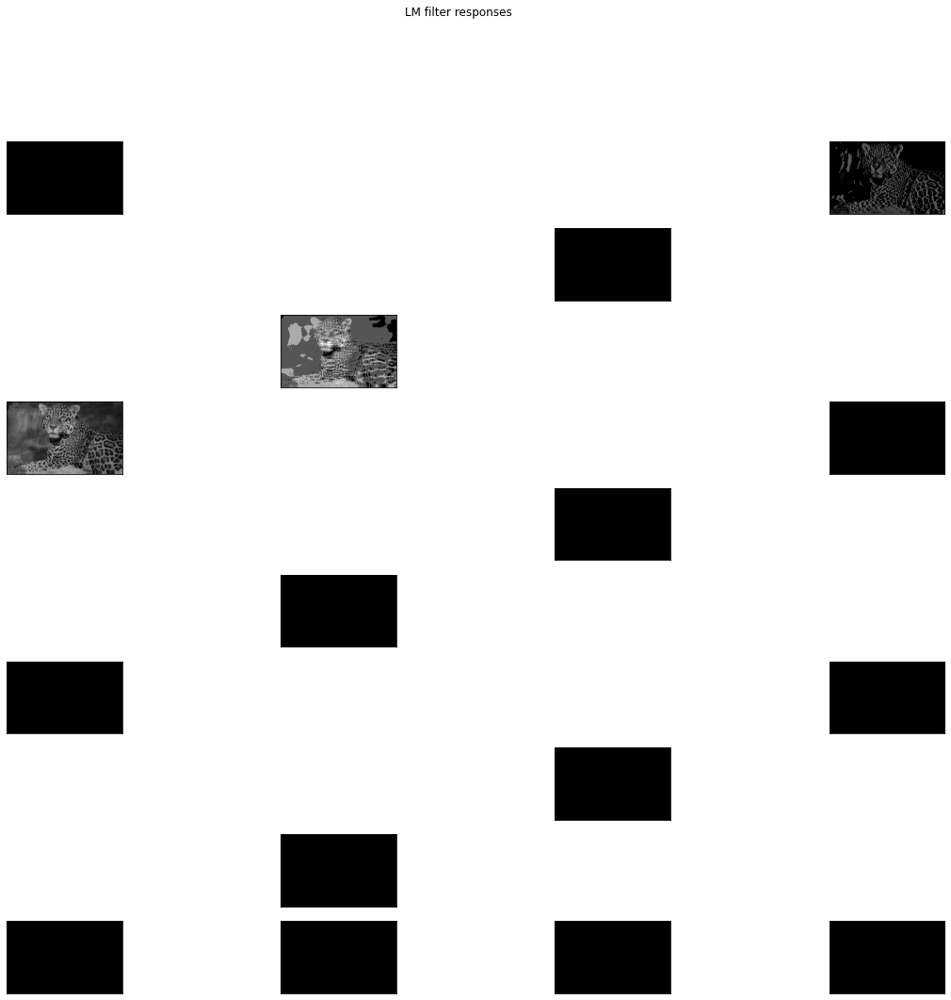

(788, 1400, 48) (788, 1400)


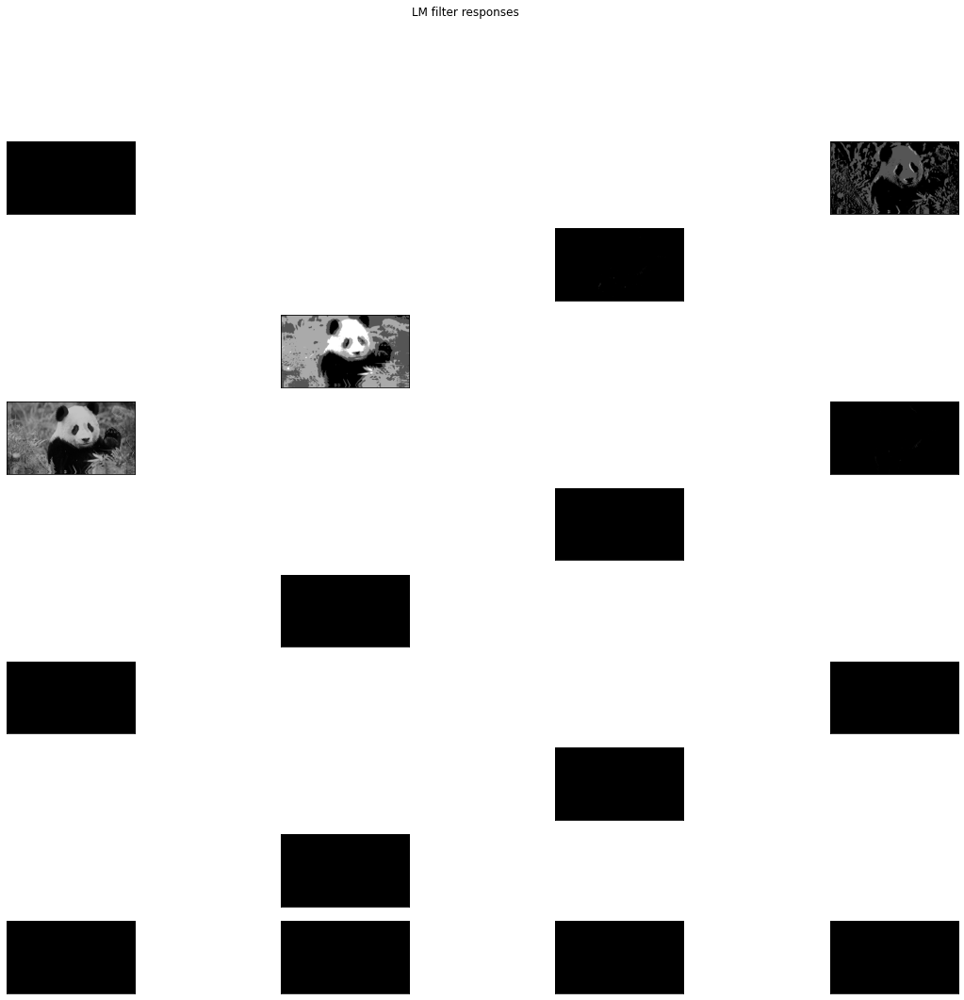

(367, 550, 48) (367, 550)


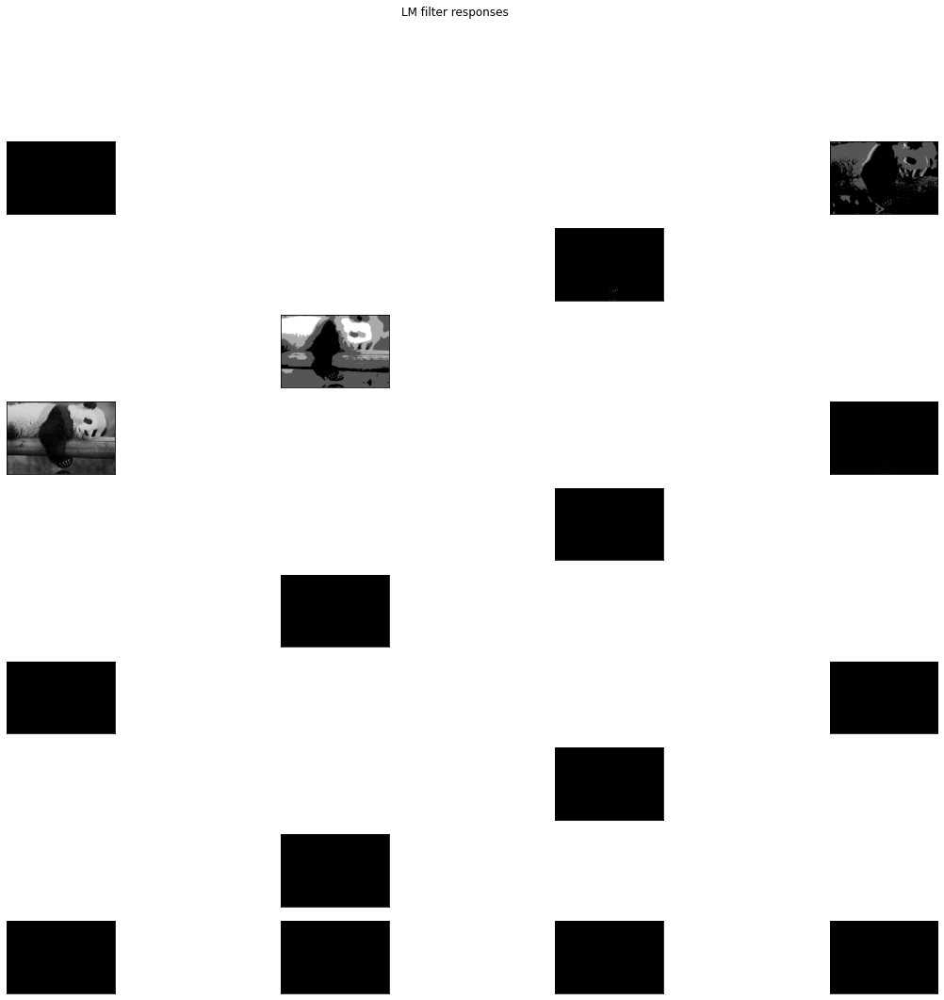

In [ ]:
# Loop through each image
for i in range (0, num_images):

    # Filter image and store
    FB_responses = makeResponses_sep(images[i], F, filter_vectors)
    print(FB_responses.shape, images[i].shape)

    plt.figure(figsize=(20,20))
    plt.suptitle('LM filter responses')
    nr = 12
    nc = 4

    #For each filter...
    for j in sep_list:
        
        #Plot filtered images
        plt.subplot(nr, nc, j+1)
        fig = plt.imshow(FB_responses[:,:,j], cmap='gray')
        fig.axes.get_xaxis().set_visible(False)
        fig.axes.get_yaxis().set_visible(False)

    plt.show() 